In [1]:
# Combined further-project initial checks using current further products only.
# The active science sample is: all currently science-ready `further` products.
# Downstream cells keep using the same helper names as the 20260525 notebook.

from __future__ import annotations

import math
import re
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.io import fits
from IPython.display import display

PROJECT_ROOT = Path.cwd().resolve()
RUN_LABEL = "v3tk_v7.6.8"
RUN_DIR = PROJECT_ROOT / RUN_LABEL
OUTDIR = PROJECT_ROOT / "quicklook_figures_further"

KEY_LINES = [
    "HB4861",
    "OIII5006",
    "HA6562",
    "NII6583",
    "SII6716",
    "SII6730",
    "SIII6312",
    "OII7318",
    "OII7319",
    "OII7329",
    "OII7330",
]

plt.style.use("default")
mpl.rcParams.update({
    "figure.dpi": 120,
    "font.size": 10,
    "axes.grid": False,
})

print(f"Project root: {PROJECT_ROOT}")
print(f"Current further run directory: {RUN_DIR}")
print("Active PRODUCT paths use current `further` products only.")
print("Active save paths are intentionally commented out in this notebook.")

Project root: /Users/Igniz/Desktop/ICRAR/further
Current further run directory: /Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8
Active PRODUCT paths use current `further` products only.
Active save paths are intentionally commented out in this notebook.


In [2]:
def first_existing(*paths: Path | None) -> Path | None:
    for path in paths:
        if path is not None and path.exists():
            return path
    return None


def fits_has_hdus(path: Path | None, names: list[str]) -> bool:
    if path is None or not Path(path).exists():
        return False
    try:
        with fits.open(path, memmap=True) as hdul:
            hdu_names = {h.name.upper() for h in hdul}
        return all(name.upper() in hdu_names for name in names)
    except Exception:
        return False


def align_map_to_shape(map_data, target_shape, *, label="map", fill_value=np.nan, max_delta=2):
    """Align a nearly matching 2D map to target_shape by copying the overlap."""
    target_shape = tuple(target_shape)
    arr = np.asarray(map_data, dtype=float)
    if arr.shape == target_shape:
        return arr
    if arr.ndim != len(target_shape):
        raise ValueError(f"{label}: cannot align ndim {arr.ndim} to target shape {target_shape}")

    deltas = tuple(abs(src - dst) for src, dst in zip(arr.shape, target_shape))
    if any(delta > max_delta for delta in deltas):
        raise ValueError(f"{label}: shape {arr.shape} differs too much from target {target_shape}")

    aligned = np.full(target_shape, fill_value, dtype=float)
    overlap = tuple(min(src, dst) for src, dst in zip(arr.shape, target_shape))
    slices = tuple(slice(0, n) for n in overlap)
    aligned[slices] = arr[slices]
    print(f"  {label}: aligned shape {arr.shape} -> {target_shape}; overlap={overlap}")
    return aligned


def intrinsic_sigma_from_maps(sigma_obs, sigma_corr, *, label="sigma"):
    """Return intrinsic sigma = sqrt(SIGMA^2 - SIGMA_CORR^2), masking nonphysical pixels."""
    if sigma_obs is None or sigma_corr is None:
        return None
    sigma_obs = np.asarray(sigma_obs, dtype=float)
    sigma_corr = align_map_to_shape(sigma_corr, sigma_obs.shape, label=f"{label} correction")
    sigma2_intrinsic = sigma_obs**2 - sigma_corr**2
    sigma_intrinsic = np.full(sigma_obs.shape, np.nan, dtype=float)
    ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
    sigma_intrinsic[ok] = np.sqrt(sigma2_intrinsic[ok])
    return sigma_intrinsic


def discover_further_products(run_dir: Path = RUN_DIR) -> pd.DataFrame:
    rows = []
    if not run_dir.exists():
        raise FileNotFoundError(f"Missing run directory: {run_dir}")

    for gal_dir in sorted(p for p in run_dir.iterdir() if p.is_dir()):
        gal = gal_dir.name
        spatial_raw = gal_dir / f"{gal}_spatial_binning_maps.fits"
        spatial_further = gal_dir / f"{gal}_spatial_binning_maps_further.fits"
        gas_raw_lower = gal_dir / f"{gal}_gas_bin_maps.fits"
        gas_raw_upper = gal_dir / f"{gal}_gas_BIN_maps.fits"
        gas_further_lower = gal_dir / f"{gal}_gas_bin_maps_further.fits"
        gas_further_upper = gal_dir / f"{gal}_gas_BIN_maps_further.fits"
        sfh = gal_dir / f"{gal}_sfh_maps.fits"
        sfh_weights = gal_dir / f"{gal}_sfh_weights.fits"
        kin = gal_dir / f"{gal}_kin_maps.fits"
        gas_spaxel = gal_dir / f"{gal}_gas_spaxel_maps.fits"
        mask = gal_dir / f"{gal}_mask.fits"

        spatial_preferred = first_existing(spatial_further, spatial_raw)
        gas_preferred = first_existing(gas_further_lower, gas_further_upper, gas_raw_lower, gas_raw_upper)

        rows.append({
            "galaxy": gal,
            "folder": gal_dir,
            "spatial_path": spatial_preferred,
            "gas_path": gas_preferred,
            "ew_path": first_existing(gal_dir / f"{gal}_proxy_EW_maps_further.fits", gal_dir / f"{gal}_proxy_EW_maps.fits"),
            "sfh_path": sfh if sfh.exists() else None,
            "sfh_weights_path": sfh_weights if sfh_weights.exists() else None,
            "kin_path": kin if kin.exists() else None,
            "gas_spaxel_path": gas_spaxel if gas_spaxel.exists() else None,
            "mask_path": mask if mask.exists() else None,
            "sfr_log_path": first_existing(PROJECT_ROOT / "sfr_logs" / f"{gal}.log", gal_dir / "sfr_logs" / f"{gal}.log"),
            "mass_log_path": first_existing(PROJECT_ROOT / "mass_logs" / f"{gal}.log", gal_dir / "mass_logs" / f"{gal}.log"),
            "source": "further",
            "has_spatial": spatial_preferred is not None,
            "has_gas": gas_preferred is not None,
            "has_sfh": sfh.exists(),
            "has_sfh_weights": sfh_weights.exists(),
            "has_kin": kin.exists(),
            "has_gas_spaxel": gas_spaxel.exists(),
            "has_mask": mask.exists(),
            "has_spatial_further": spatial_further.exists(),
            "has_gas_further": gas_further_lower.exists() or gas_further_upper.exists(),
        })

    table = pd.DataFrame(rows).set_index("galaxy", drop=False)
    if table.empty:
        raise RuntimeError(f"No galaxy folders found below {run_dir}")

    table["has_mass_map"] = [fits_has_hdus(path, ["LOGMASS_SURFACE_DENSITY"]) for path in table["spatial_path"]]
    table["has_sfr_map"] = [fits_has_hdus(path, ["LOGSFR_SURFACE_DENSITY_HII", "LOGSFR_SURFACE_DENSITY_SF"]) for path in table["gas_path"]]
    table["has_o3n2_m13"] = [fits_has_hdus(path, ["O_H_O3N2_M13_HII", "O_H_O3N2_M13_SF"]) for path in table["gas_path"]]
    table["has_proxy_ew"] = table["ew_path"].notna()
    table["ready_physics_maps"] = table["has_mass_map"] & table["has_sfr_map"] & table["has_o3n2_m13"]
    table["ready_raw_gas_qc"] = table["has_spatial"] & table["has_gas"]
    table["ready_sfh_qc"] = table["has_spatial"] & table["has_sfh"]
    return table



CURRENT_PRODUCTS = discover_further_products()

CURRENT_READY_PHYSICS_GALAXIES = CURRENT_PRODUCTS.index[CURRENT_PRODUCTS["ready_physics_maps"]].tolist()
CURRENT_NOT_PHYSICS_READY = CURRENT_PRODUCTS.index[~CURRENT_PRODUCTS["ready_physics_maps"]].tolist()

FAKE_GALAXIES = []
UNREUSABLE_MISSING_GALAXIES = CURRENT_NOT_PHYSICS_READY

PRODUCTS = CURRENT_PRODUCTS.copy()
PRODUCTS["source"] = "further_ready"
PRODUCTS.loc[~PRODUCTS["ready_physics_maps"], "source"] = "further_not_science_ready"
PRODUCTS["fake_reason"] = ""
PRODUCTS.loc[UNREUSABLE_MISSING_GALAXIES, "fake_reason"] = "kept for inventory/QC only; not science-ready in current further products"

ANALYSIS_GALAXIES = CURRENT_READY_PHYSICS_GALAXIES
QC_GALAXIES = PRODUCTS.index[PRODUCTS["ready_raw_gas_qc"]].tolist()
SFH_QC_GALAXIES = PRODUCTS.index[PRODUCTS["ready_sfh_qc"]].tolist()
DISPLAY_COLUMNS = [
    "source",
    "has_spatial",
    "has_gas",
    "has_mass_map",
    "has_sfr_map",
    "has_o3n2_m13",
    "has_proxy_ew",
    "has_sfh",
    "has_sfh_weights",
    "has_kin",
    "has_gas_spaxel",
    "has_mask",
    "spatial_path",
    "gas_path",
    "ew_path",
    "sfr_log_path",
    "mass_log_path",
    "fake_reason",
]

print(f"Discovered current galaxy folders: {len(CURRENT_PRODUCTS)}")
print(f"Science-ready current further galaxies: {len(CURRENT_READY_PHYSICS_GALAXIES)}")
print(f"Not science-ready current further galaxies: {len(CURRENT_NOT_PHYSICS_READY)}")
print("Extended fallback galaxies: 0 (disabled; using current further products only)")
print("Analysis galaxies:", ", ".join(ANALYSIS_GALAXIES))
print("Current not-science-ready galaxies:", ", ".join(UNREUSABLE_MISSING_GALAXIES) if UNREUSABLE_MISSING_GALAXIES else "none")
display(PRODUCTS[DISPLAY_COLUMNS])

def further_spatial_path(galaxy: str) -> Path:
    path = PRODUCTS.loc[galaxy, "spatial_path"]
    if path is None:
        raise FileNotFoundError(f"No spatial product registered for {galaxy}")
    return Path(path)


def further_gas_path(galaxy: str) -> Path:
    path = PRODUCTS.loc[galaxy, "gas_path"]
    if path is None:
        raise FileNotFoundError(f"No gas product registered for {galaxy}")
    return Path(path)


def further_ew_path(galaxy: str, suffix: str | None = None) -> Path:
    if galaxy in PRODUCTS.index and PRODUCTS.loc[galaxy, "ew_path"] is not None:
        return Path(PRODUCTS.loc[galaxy, "ew_path"])

    suffixes = []
    if suffix:
        suffixes.append(suffix)
    suffixes.extend(["_proxy_EW_maps.fits", "_proxy_EW_maps_further.fits", "_pseudo_EW_maps.fits"])
    candidates = []
    for suffix_item in dict.fromkeys(suffixes):
        candidates.append(RUN_DIR / galaxy / f"{galaxy}{suffix_item}")
        candidates.append(PROJECT_ROOT / f"{galaxy}{suffix_item}")
    found = first_existing(*candidates)
    if found is None:
        checked = "\n".join(f"  - {path}" for path in candidates)
        raise FileNotFoundError(f"No EW product found for {galaxy}. Checked:\n{checked}")
    return found


def sfr_log_path(galaxy: str) -> Path | None:
    if galaxy in PRODUCTS.index:
        path = PRODUCTS.loc[galaxy, "sfr_log_path"]
        return None if path is None else Path(path)
    return first_existing(PROJECT_ROOT / "sfr_logs" / f"{galaxy}.log", RUN_DIR / galaxy / "sfr_logs" / f"{galaxy}.log")


def mass_log_path(galaxy: str) -> Path | None:
    if galaxy in PRODUCTS.index:
        path = PRODUCTS.loc[galaxy, "mass_log_path"]
        return None if path is None else Path(path)
    return first_existing(PROJECT_ROOT / "mass_logs" / f"{galaxy}.log", RUN_DIR / galaxy / "mass_logs" / f"{galaxy}.log")


def physics_ready_galaxies(require_ew: bool = True) -> list[str]:
    galaxies = PRODUCTS.index[PRODUCTS["ready_physics_maps"]].tolist()
    if require_ew:
        galaxies = [gal for gal in galaxies if PRODUCTS.loc[gal, "has_proxy_ew"]]
    return galaxies


def old_paper_cells_ready(require_ew: bool = True) -> bool:
    return len(physics_ready_galaxies(require_ew=require_ew)) > 0




Discovered current galaxy folders: 29
Science-ready current further galaxies: 29
Not science-ready current further galaxies: 0
Extended fallback galaxies: 0 (disabled; using current further products only)
Analysis galaxies: IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4383, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698
Current not-science-ready galaxies: none


,source,has_spatial,has_gas,has_mass_map,has_sfr_map,has_o3n2_m13,has_proxy_ew,has_sfh,has_sfh_weights,has_kin,has_gas_spaxel,has_mask,spatial_path,gas_path,ew_path,sfr_log_path,mass_log_path,fake_reason
galaxy,,,,,,,,,,,,,,,,,,
IC3392,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/IC...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/I...,
NGC4064,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4189,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4192,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4254,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4293,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4294,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4298,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4302,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,


In [3]:
import matplotlib as mpl

# Increase tick label font sizes and tick length/width globally for all plots
mpl.rcParams.update({
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "xtick.major.size": 6,
    "ytick.major.size": 6,
    "xtick.minor.size": 4,
    "ytick.minor.size": 4,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
    "xtick.minor.width": 1.0,
    "ytick.minor.width": 1.0,
    "xtick.direction": "in",
    "ytick.direction": "in",
})


## Fixed galaxy colors

The mapping below is copied from `20260530_MAUVE_galaxy_colors.md` and the palette-test notebook convention, not loaded from `MAUVE_galaxy_colors.dat`.

In [4]:
# Fixed MAUVE galaxy-color convention copied from:
# - 20260530_MAUVE_galaxy_colors.md
# - 20260529_test_galaxy_color_palette.ipynb
#
# Per request, this notebook does not load MAUVE_galaxy_colors.dat.
from matplotlib.colors import ListedColormap

FIXED_GALAXY_PALETTE_NAME = "MAUVE_GALAXY_GLASBEY_PACKAGE_40"
FIXED_GALAXY_ORDER = [
    'IC3392',
    'NGC4064',
    'NGC4189',
    'NGC4192',
    'NGC4216',
    'NGC4222',
    'NGC4254',
    'NGC4293',
    'NGC4294',
    'NGC4298',
    'NGC4302',
    'NGC4321',
    'NGC4330',
    'NGC4351',
    'NGC4380',
    'NGC4383',
    'NGC4388',
    'NGC4394',
    'NGC4396',
    'NGC4402',
    'NGC4405',
    'NGC4419',
    'NGC4424',
    'NGC4450',
    'NGC4457',
    'NGC4501',
    'NGC4522',
    'NGC4535',
    'NGC4548',
    'NGC4567',
    'NGC4568',
    'NGC4569',
    'NGC4579',
    'NGC4580',
    'NGC4606',
    'NGC4607',
    'NGC4654',
    'NGC4689',
    'NGC4694',
    'NGC4698',
]
TOTAL_ASSEMBLED_COLOR = "black"
FIXED_GALAXY_COLORS = {
    'IC3392': '#d21820',
    'NGC4064': '#6175ff',
    'NGC4189': '#008a00',
    'NGC4192': '#ff79fb',
    'NGC4216': '#aafb00',
    'NGC4222': '#713971',
    'NGC4254': '#00dbc2',
    'NGC4293': '#ff9e04',
    'NGC4294': '#35595d',
    'NGC4298': '#6d4904',
    'NGC4302': '#aa657d',
    'NGC4321': '#a2aaff',
    'NGC4330': '#92aa65',
    'NGC4351': '#a241ff',
    'NGC4380': '#00ff96',
    'NGC4383': '#c60079',
    'NGC4388': '#ffaeca',
    'NGC4394': '#697996',
    'NGC4396': '#a67d00',
    'NGC4402': '#697955',
    'NGC4405': '#ffe392',
    'NGC4419': '#ff6182',
    'NGC4424': '#863135',
    'NGC4450': '#a6e7ff',
    'NGC4457': '#1cc600',
    'NGC4501': '#35518e',
    'NGC4522': '#ff5d00',
    'NGC4535': '#a682be',
    'NGC4548': '#04a6ef',
    'NGC4567': '#04aa75',
    'NGC4568': '#aa592d',
    'NGC4569': '#cac200',
    'NGC4579': '#08612d',
    'NGC4580': '#dfd2fb',
    'NGC4606': '#ca9679',
    'NGC4607': '#d200df',
    'NGC4654': '#8eaaba',
    'NGC4689': '#bae3c2',
    'NGC4694': '#6500ff',
    'NGC4698': '#008a8a',
    'NGC4567_8': '#04aa75',
}
FIXED_GALAXY_CMAP = ListedColormap(
    [FIXED_GALAXY_COLORS[g] for g in FIXED_GALAXY_ORDER],
    name=FIXED_GALAXY_PALETTE_NAME,
)

def galaxy_color(galaxy: str) -> str:
    if galaxy in FIXED_GALAXY_COLORS:
        return FIXED_GALAXY_COLORS[galaxy]
    print(f"Warning: {galaxy} is not in the fixed MAUVE galaxy palette; using gray fallback.")
    return "#777777"

def ordered_galaxies_by_fixed_palette(galaxies):
    requested = list(galaxies)
    remaining = set(requested)
    ordered = []
    for galaxy in FIXED_GALAXY_ORDER:
        if galaxy in remaining:
            ordered.append(galaxy)
            remaining.remove(galaxy)
        if galaxy == "NGC4567" and "NGC4567_8" in remaining:
            ordered.append("NGC4567_8")
            remaining.remove("NGC4567_8")
    ordered.extend(sorted(remaining))
    return ordered

def galaxy_legend_handles(galaxies, marker="o", markersize=6):
    from matplotlib.lines import Line2D
    return [
        Line2D(
            [0], [0], marker=marker, color="none", linestyle="None",
            markerfacecolor=galaxy_color(galaxy), markeredgecolor="none",
            markersize=markersize, label=galaxy,
        )
        for galaxy in galaxies
    ]

print(f"Loaded fixed {FIXED_GALAXY_PALETTE_NAME} mapping for {len(FIXED_GALAXY_ORDER)} component galaxies.")
print(f"NGC4567_8 alias color: {FIXED_GALAXY_COLORS['NGC4567_8']}; total/pooled color: {TOTAL_ASSEMBLED_COLOR}")


Loaded fixed MAUVE_GALAXY_GLASBEY_PACKAGE_40 mapping for 40 component galaxies.
NGC4567_8 alias color: #04aa75; total/pooled color: black


In [5]:
# Reusable helpers for fixed-galaxy-color plot variants.
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
from scipy.optimize import curve_fit
import scipy.ndimage as ndimage
import scipy.stats as stats

EW_FILE_SUFFIX = "_proxy_EW_maps.fits"
EW_HDU = "PROXY_EWHA"
EW_MIN = 6.0
EXCLUDED_GALAXIES = {"NGC4383"}
COMMON_YLIM_M13 = (8.2, 8.9)
COMMON_YLIM_M13_C20 = (8.2, 9.1)
XRANGE_RMZR = (6.0, 10.0)
XRANGE_ZGAS = (-5.0, 0.5)


def require_hdu_data(hdul, hdu_name, filename):
    if hdu_name not in hdul:
        raise KeyError(f"Missing HDU {hdu_name!r} in {filename}")
    return np.asarray(hdul[hdu_name].data, dtype=float)


def intrinsic_ha_sigma_from_gas_hdul(h_gas, galaxy):
    ha_sigma_obs = require_hdu_data(h_gas, "HA6562_SIGMA", further_gas_path(galaxy))
    ha_sigma_corr = require_hdu_data(h_gas, "HA6562_SIGMA_CORR", further_gas_path(galaxy))
    ha_sigma_corr = align_map_to_shape(ha_sigma_corr, ha_sigma_obs.shape, label=f"{galaxy} HA6562_SIGMA_CORR")
    sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
    ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
    sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
    ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
    return ha_sigma


def load_common_maps_for_galaxy(galaxy, *, include_c20=False, require_sigma_mask=True):
    spatial_path = further_spatial_path(galaxy)
    gas_path = further_gas_path(galaxy)
    ew_path = further_ew_path(galaxy, EW_FILE_SUFFIX)

    with fits.open(spatial_path) as h_spatial:
        log_sigma_m = require_hdu_data(h_spatial, "LOGMASS_SURFACE_DENSITY", spatial_path)

    with fits.open(gas_path) as h_gas:
        log_sigma_sfr = require_hdu_data(h_gas, "LOGSFR_SURFACE_DENSITY_HII", gas_path)
        oh_m13 = require_hdu_data(h_gas, "O_H_O3N2_M13_HII", gas_path)
        oh_c20 = require_hdu_data(h_gas, "O_H_O3N2_C20_HII", gas_path) if include_c20 else None
        ha_sigma = intrinsic_ha_sigma_from_gas_hdul(h_gas, galaxy) if require_sigma_mask else None

    with fits.open(ew_path) as h_ew:
        ew_ha = require_hdu_data(h_ew, EW_HDU, ew_path)
    ew_ha = align_map_to_shape(ew_ha, log_sigma_sfr.shape, label=f"{galaxy} {EW_HDU}")

    out = {
        "logSigmaM": log_sigma_m,
        "logSigmaSFR": log_sigma_sfr,
        "oh_m13": oh_m13,
        "oh_c20": oh_c20,
        "ew_ha": ew_ha,
        "ha_sigma": ha_sigma,
    }
    return out


def calculate_binned_stats_for_color(x_data, y_data, bin_width=0.4, min_pixels=20):
    x_data = np.asarray(x_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)
    finite = np.isfinite(x_data) & np.isfinite(y_data)
    x_data = x_data[finite]
    y_data = y_data[finite]
    if x_data.size == 0:
        return (np.array([]), np.array([]), np.array([]), np.array([]), np.array([]))
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
        return (np.array([]), np.array([]), np.array([]), np.array([]), np.array([]))
    bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    medians, stds, counts, centers, valid_bin_indices = [], [], [], [], []
    for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
        in_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_bin]
        x_in_bin = x_data[in_bin]
        if np.sum(np.isfinite(y_in_bin)) >= min_pixels:
            centers.append(np.nanmedian(x_in_bin))
            medians.append(np.nanmedian(y_in_bin))
            stds.append(np.nanstd(y_in_bin))
            counts.append(np.sum(np.isfinite(y_in_bin)))
            valid_bin_indices.append(i)
    return (np.asarray(centers), np.asarray(medians), np.asarray(stds), np.asarray(counts), np.asarray(valid_bin_indices))


def mzr_model_for_color(x, a, b, c):
    return a + b * (x - c) * np.exp(-(x - c))


def compute_density_mask_for_color(x_vals, y_vals, x_range, y_range, nbins=100, sigma=2.0, return_contour=False):
    x_vals = np.asarray(x_vals, dtype=float)
    y_vals = np.asarray(y_vals, dtype=float)
    mask_finite = np.isfinite(x_vals) & np.isfinite(y_vals)
    empty_mask = np.zeros_like(x_vals, dtype=bool)
    if not np.any(mask_finite):
        return (empty_mask, None, None) if return_contour else empty_mask
    x = x_vals[mask_finite]
    y = y_vals[mask_finite]
    H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
    if np.sum(H) <= 0:
        return (empty_mask, None, None) if return_contour else empty_mask
    H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
    H_flat = np.sort(H_smooth.ravel())[::-1]
    H_cumsum = np.cumsum(H_flat)
    if H_cumsum[-1] <= 0:
        return (empty_mask, None, None) if return_contour else empty_mask
    level_idx = np.searchsorted(H_cumsum, 0.95 * H_cumsum[-1])
    level_idx = min(level_idx, len(H_flat) - 1)
    level_95 = H_flat[level_idx]
    x_centers = 0.5 * (xedges[:-1] + xedges[1:])
    y_centers = 0.5 * (yedges[:-1] + yedges[1:])
    X, Y = np.meshgrid(x_centers, y_centers)
    dx = (x_range[1] - x_range[0]) / nbins
    dy = (y_range[1] - y_range[0]) / nbins
    x_idx = (x - x_range[0]) / dx - 0.5
    y_idx = (y - y_range[0]) / dy - 0.5
    densities = ndimage.map_coordinates(H_smooth, [x_idx, y_idx], order=1, mode="constant", cval=0.0)
    mask_local = densities >= level_95
    full_mask = np.zeros_like(x_vals, dtype=bool)
    full_mask[np.where(mask_finite)[0]] = mask_local
    if return_contour:
        return full_mask, level_95, (X, Y, H_smooth)
    return full_mask


def density_contour_level_for_color(H_smooth, enclosed_fraction=0.95):
    positive = np.asarray(H_smooth, dtype=float)
    positive = positive[np.isfinite(positive) & (positive > 0)]
    if positive.size < 4:
        return None
    ordered = np.sort(positive.ravel())[::-1]
    cumulative = np.cumsum(ordered)
    if cumulative[-1] <= 0:
        return None
    idx = int(np.searchsorted(cumulative, enclosed_fraction * cumulative[-1]))
    idx = min(idx, ordered.size - 1)
    level = float(ordered[idx])
    if not (positive.min() < level < positive.max()):
        level = float(0.5 * (positive.min() + positive.max()))
    return level


def plot_closed_95_contour_for_color(
    ax,
    x_vals,
    y_vals,
    *,
    x_range,
    y_range,
    color,
    label=None,
    nbins=90,
    sigma=1.5,
    min_points=50,
    linewidth=1.8,
    alpha=0.9,
    linestyle="-",
):
    """Draw one closed 95% density contour for a galaxy point distribution."""
    x_vals = np.asarray(x_vals, dtype=float)
    y_vals = np.asarray(y_vals, dtype=float)
    finite = np.isfinite(x_vals) & np.isfinite(y_vals)
    if np.sum(finite) < min_points:
        return None
    x = x_vals[finite]
    y = y_vals[finite]
    H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
    if np.sum(H) <= 0:
        return None
    H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
    level = density_contour_level_for_color(H_smooth, enclosed_fraction=0.95)
    if level is None:
        return None
    x_centers = 0.5 * (xedges[:-1] + xedges[1:])
    y_centers = 0.5 * (yedges[:-1] + yedges[1:])
    X, Y = np.meshgrid(x_centers, y_centers)
    contour = ax.contour(
        X,
        Y,
        H_smooth.T,
        levels=[level],
        colors=[color],
        linewidths=linewidth,
        linestyles=linestyle,
        alpha=alpha,
    )
    if label is not None:
        contour.collections[0].set_label(label)
    return contour


def galaxy_contour_legend_handles(galaxies, linewidth=2.0):
    from matplotlib.lines import Line2D
    return [Line2D([0], [0], color=galaxy_color(galaxy), lw=linewidth, label=galaxy) for galaxy in galaxies]


def plot_literature_mzr_fits_for_color(ax, show_legend=True):
    plot_data = []
    x_sanchez = np.linspace(7.05, 9.15, 200)
    a5, b5, c5 = 8.74, 0.013, 9.50
    y_sanchez13 = a5 + b5 * (x_sanchez - c5) * np.exp(-(x_sanchez - c5))
    plot_data.append((x_sanchez, y_sanchez13, "Sánchez+13 (CALIFA, z~0.016)", "--", "cyan"))
    x_bb = np.linspace(7.0, 8.9, 200)
    a2, b2, c2 = 8.55, 0.014, 9.14
    y_bb16 = a2 + b2 * (x_bb - c2) * np.exp(-(x_bb - c2))
    plot_data.append((x_bb, y_bb16, "BB+16 (MaNGA, z~0.045)", "--", "green"))
    x_ef = np.linspace(6.5, 10.0, 200)
    a4, b4, c4 = 8.61, 0.008, 10.0
    y_ef19 = a4 + b4 * (x_ef - c4) * np.exp(-(x_ef - c4))
    plot_data.append((x_ef, y_ef19, "EF+19 (MAD, z<0.013)", "--", "blue"))
    handles = []
    for x, y, label, linestyle, color in plot_data:
        line, = ax.plot(x, y, label=label if show_legend else None, linewidth=2, linestyle=linestyle, color=color)
        handles.append(line)
    return handles


def plot_literature_baker_for_color(ax, show_legend=True):
    x_baker = np.linspace(6.1, 8.5, 200)
    logSigmaSFR_ref = -2.0
    Z0_B = 8.75
    gamma_B = 0.14
    phi_B = 2.73
    m0_B = 8.58
    m1_B = 0.50
    logM0_B = m0_B + m1_B * logSigmaSFR_ref
    M0_B = 10.0 ** logM0_B
    Sigma_star_B = 10.0 ** x_baker
    y_baker23 = Z0_B - (gamma_B / phi_B) * np.log10(1.0 + (Sigma_star_B / M0_B) ** (-phi_B))
    line, = ax.plot(x_baker, y_baker23, label="Baker+23 (MaNGA, z~0.03)" if show_legend else None, linewidth=2, linestyle="--", color="brown")
    return [line]


def safe_fit_and_plot_for_color(ax, x, y, linestyle, label):
    finite = np.isfinite(x) & np.isfinite(y)
    x_fit_data = np.asarray(x)[finite]
    y_fit_data = np.asarray(y)[finite]
    if len(x_fit_data) < 10:
        print(f"{label}: not enough points for fitting.")
        return None, None, None, None
    p0 = [8.5, 0.0002, 12.5]
    bounds = ([8.0, 0.0, 10.0], [9.0, 0.1, 15.0])
    try:
        popt, pcov = curve_fit(mzr_model_for_color, x_fit_data, y_fit_data, p0=p0, bounds=bounds, maxfev=5000)
        x_model = np.linspace(np.nanmin(x_fit_data), np.nanmax(x_fit_data), 150)
        y_model = mzr_model_for_color(x_model, *popt)
        line, = ax.plot(x_model, y_model, linestyle, linewidth=2, color=TOTAL_ASSEMBLED_COLOR, label=label)
        perr = np.sqrt(np.diag(pcov))
        print(f"{label}: a={popt[0]:.3f} ± {perr[0]:.3f}, b={popt[1]:.5f} ± {perr[1]:.5f}, c={popt[2]:.3f} ± {perr[2]:.3f}")
        return line, popt, pcov, (x_model, y_model)
    except Exception as exc:
        print(f"{label} fit failed: {exc}")
        return None, None, None, None


def plot_global_median_for_color(ax, x, y, *, x_range, y_range, label, bin_width=0.4, min_pixels=20):
    mask_95 = compute_density_mask_for_color(x, y, x_range, y_range)
    centers, medians, stds, counts, valid_indices = calculate_binned_stats_for_color(x[mask_95], y[mask_95], bin_width=bin_width, min_pixels=min_pixels)
    if len(centers) >= 3:
        yerr = stds / np.sqrt(counts)
        handle = ax.errorbar(centers, medians, yerr=yerr, color=TOTAL_ASSEMBLED_COLOR, marker="o", markersize=6, linewidth=2.0, capsize=4, capthick=1.5, alpha=0.95, label=label)
        return handle
    return None


def calculate_binned_stats_unique_for_color(x_data, y_data, *, bin_width=0.2, min_unique=20):
    x_data = np.asarray(x_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)
    finite = np.isfinite(x_data) & np.isfinite(y_data)
    x_data = x_data[finite]
    y_data = y_data[finite]
    if x_data.size == 0:
        return np.array([]), np.array([]), np.array([]), np.array([])
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
        return np.array([]), np.array([]), np.array([]), np.array([])
    bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    if bin_edges.size < 2:
        return np.array([]), np.array([]), np.array([]), np.array([])
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    valid_centers, medians, stds, counts = [], [], [], []
    for center, bin_start, bin_end in zip(centers, bin_edges[:-1], bin_edges[1:]):
        in_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_bin = y_data[in_bin]
        if len(np.unique(y_bin[np.isfinite(y_bin)])) >= min_unique:
            valid_centers.append(center)
            medians.append(np.nanmedian(y_bin))
            stds.append(np.nanstd(y_bin))
            counts.append(np.sum(np.isfinite(y_bin)))
    return np.asarray(valid_centers), np.asarray(medians), np.asarray(stds), np.asarray(counts)


def spearman_rho_by_primary_bin_for_color(
    primary_axis,
    companion_axis,
    oh_axis,
    *,
    n_bins=6,
    percentile_limits=(2.5, 97.5),
    trend_bin_width=0.2,
    min_unique=20,
):
    """Cell-17 style Spearman rho of delta [O/H] vs delta companion in primary-axis bins."""
    primary_axis = np.asarray(primary_axis, dtype=float)
    companion_axis = np.asarray(companion_axis, dtype=float)
    oh_axis = np.asarray(oh_axis, dtype=float)
    valid_all = np.isfinite(primary_axis) & np.isfinite(companion_axis) & np.isfinite(oh_axis)
    if np.sum(valid_all) < 10:
        return np.array([]), np.array([]), np.array([]), np.array([])

    primary_min = np.nanpercentile(primary_axis[valid_all], percentile_limits[0])
    primary_max = np.nanpercentile(primary_axis[valid_all], percentile_limits[1])
    if not np.isfinite(primary_min) or not np.isfinite(primary_max) or primary_min == primary_max:
        return np.array([]), np.array([]), np.array([]), np.array([])

    edges = np.linspace(primary_min, primary_max, n_bins + 1)
    centers = 0.5 * (edges[:-1] + edges[1:])
    rho_centers, rho_values, p_values, counts = [], [], [], []

    for i, center in enumerate(centers):
        if i == n_bins - 1:
            bin_mask = valid_all & (primary_axis >= edges[i]) & (primary_axis <= edges[i + 1])
        else:
            bin_mask = valid_all & (primary_axis >= edges[i]) & (primary_axis < edges[i + 1])
        n_pixels = int(np.sum(bin_mask))
        if n_pixels <= 2:
            continue

        companion_bin = companion_axis[bin_mask]
        oh_bin = oh_axis[bin_mask]
        companion_offset = companion_bin - np.nanmean(companion_bin)
        oh_offset = oh_bin - np.nanmean(oh_bin)
        valid_corr = np.isfinite(companion_offset) & np.isfinite(oh_offset)
        if np.sum(valid_corr) <= 2:
            continue

        clip_mask = np.zeros_like(valid_corr, dtype=bool)
        companion_data = companion_offset[valid_corr]
        oh_data = oh_offset[valid_corr]
        companion_unique = np.unique(companion_data)
        oh_unique = np.unique(oh_data)
        if companion_unique.size <= 1 or oh_unique.size <= 1:
            continue

        x_mean, x_std = np.mean(companion_unique), np.std(companion_unique)
        y_mean, y_std = np.mean(oh_unique), np.std(oh_unique)
        within_3sigma = (
            (companion_data >= x_mean - 3 * x_std)
            & (companion_data <= x_mean + 3 * x_std)
            & (oh_data >= y_mean - 3 * y_std)
            & (oh_data <= y_mean + 3 * y_std)
        )
        clip_mask[valid_corr] = within_3sigma

        trend_centers, _, _, _ = calculate_binned_stats_unique_for_color(
            companion_offset[clip_mask],
            oh_offset[clip_mask],
            bin_width=trend_bin_width,
            min_unique=min_unique,
        )
        has_trend = trend_centers.size >= 3
        corr_mask = clip_mask & valid_corr
        if not has_trend or np.sum(corr_mask) <= 2:
            continue

        rho, p_value = stats.spearmanr(companion_offset[corr_mask], oh_offset[corr_mask])
        if np.isfinite(rho):
            rho_centers.append(center)
            rho_values.append(rho)
            p_values.append(p_value)
            counts.append(n_pixels)

    return np.asarray(rho_centers), np.asarray(rho_values), np.asarray(p_values), np.asarray(counts)


def plot_per_galaxy_spearman_by_mass_for_color(
    ax,
    per_galaxy,
    galaxies,
    *,
    linewidth=1.6,
    alpha=0.85,
    min_bins_to_plot=3,
):
    plotted = []
    for gal in galaxies:
        if gal not in per_galaxy:
            continue
        data = per_galaxy[gal]
        centers, rho_values, p_values, counts = spearman_rho_by_primary_bin_for_color(
            data["logSigmaM"],
            data["logSigmaSFR"],
            data["oh_m13"],
        )
        if rho_values.size < min_bins_to_plot:
            print(f"  {gal}: Spearman bins plotted=0 (valid bins={rho_values.size})")
            continue
        order = np.argsort(centers)
        ax.plot(
            centers[order],
            rho_values[order],
            color=galaxy_color(gal),
            linewidth=linewidth,
            alpha=alpha,
            label=gal,
        )
        plotted.append(gal)
        print(f"  {gal}: Spearman bins plotted={rho_values.size}")

    ax.axhline(0.0, color="0.45", linestyle="--", linewidth=1.0, alpha=0.65)
    ax.set_xlim(*XRANGE_RMZR)
    ax.set_ylim(-1.0, 1.0)
    ax.set_xlabel(r'$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax.set_ylabel(r'Spearman $\rho$ [Δ[O/H] vs Δ$\log\,\Sigma_\mathrm{SFR}$]', fontsize=12)
    ax.grid(True, alpha=0.3)
    ax.text(
        0.02,
        0.98,
        r"Per-galaxy Spearman $\rho$ in $\Sigma_*$ bins",
        transform=ax.transAxes,
        ha="left",
        va="top",
        fontsize=13,
        fontweight="bold",
    )
    return plotted


Found 17 O_H_*_HII metallicity HDUs: O_H_D16_HII, O_H_PG16_HII, O_H_N2S2_N06_HII, O_H_O3N2_M13_HII, O_H_N2_M13_HII, O_H_O3N2_PP04_HII, O_H_N2_PP04_HII, O_H_O3N2_C20_HII, O_H_O3S2_C20_HII, O_H_RS32_C20_HII, O_H_R3_C20_HII, O_H_N2_C20_HII, O_H_S2_C20_HII, O_H_COMBINED_C20_HII, O_H_BR24_DIRECT_HII, O_H_NII_OII7325_HII, O_H_NII_K25_HII
Using fixed MAUVE_GALAXY_GLASBEY_PACKAGE_40 colors; excluding {'NGC4383'} from tracks.
Processing O_H_D16_HII ...
Processing O_H_PG16_HII ...
Processing O_H_N2S2_N06_HII ...
Processing O_H_O3N2_M13_HII ...
Processing O_H_N2_M13_HII ...
Processing O_H_O3N2_PP04_HII ...
Processing O_H_N2_PP04_HII ...
Processing O_H_O3N2_C20_HII ...
Processing O_H_O3S2_C20_HII ...
Processing O_H_RS32_C20_HII ...
Processing O_H_R3_C20_HII ...
Processing O_H_N2_C20_HII ...
Processing O_H_S2_C20_HII ...
Processing O_H_COMBINED_C20_HII ...
Processing O_H_BR24_DIRECT_HII ...
  Skipping O_H_BR24_DIRECT_HII: all NaN after masks.
Processing O_H_NII_OII7325_HII ...
Processing O_H_NII_K2

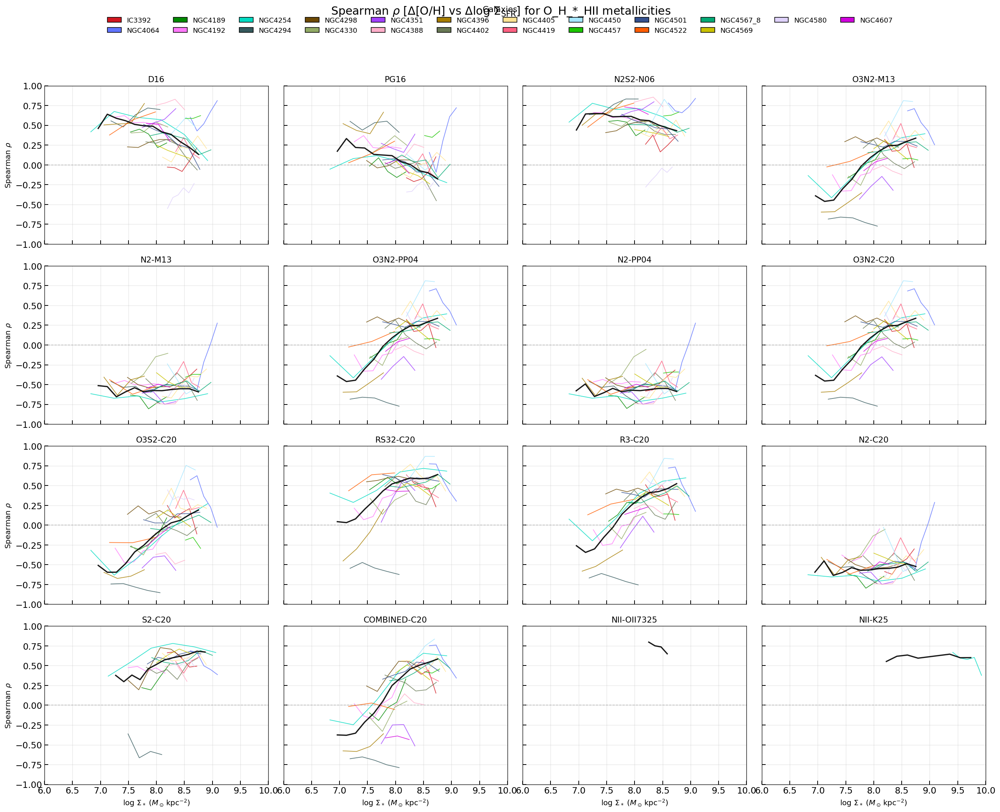

In [8]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # Δ[O/H] vs Δlog Σ_SFR Spearman rho vs Σ_* for all finite O_H_*_HII maps
    # ------------------------------------------------------------------
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0

    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    from scipy.stats import spearmanr
    from matplotlib.patches import Patch

    def metallicity_label(hdu_name):
        return hdu_name.removeprefix('O_H_').removesuffix('_HII').replace('_', '-')

    def discover_hii_metallicity_hdus(galaxies):
        hdu_names = []
        seen = set()
        for gal in galaxies:
            try:
                with fits.open(further_gas_path(gal)) as h_gas:
                    for hdu in h_gas:
                        name = hdu.name
                        if name.startswith('O_H_') and name.endswith('_HII') and name not in seen:
                            seen.add(name)
                            hdu_names.append(name)
            except Exception as e:
                print(f"Skipping metallicity discovery for {gal}: {e}")
        return hdu_names

    def load_base_maps(gal):
        spatial_path = further_spatial_path(gal)
        gas_path = further_gas_path(gal)
        ew_path = further_ew_path(gal, EW_FILE_SUFFIX)

        if not (Path(spatial_path).exists() and Path(gas_path).exists() and Path(ew_path).exists()):
            raise FileNotFoundError(f'Required FITS files for {gal} not found.')

        with fits.open(spatial_path) as h_spatial:
            sigM = h_spatial['LOGMASS_SURFACE_DENSITY'].data
        with fits.open(gas_path) as h_gas:
            sigSFR = h_gas['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h_gas['HA6562_SIGMA'].data
            ha_sigma_corr = h_gas['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h_gas else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gas_path}')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
        with fits.open(ew_path) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_path}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR.shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR = np.where(ew_mask, sigSFR, np.nan)
        return sigM, sigSFR, ew_mask

    def load_metallicity_map(gal, hdu_name, ew_mask):
        with fits.open(further_gas_path(gal)) as h_gas:
            if hdu_name not in h_gas:
                return None
            oh_map = h_gas[hdu_name].data
        return np.where(ew_mask, oh_map, np.nan)

    def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_unique=20):
        x_data = np.asarray(x_data)
        y_data = np.asarray(y_data)
        finite = np.isfinite(x_data) & np.isfinite(y_data)
        if np.sum(finite) == 0:
            return np.array([]), np.array([]), np.array([]), np.array([])
        x_min, x_max = np.nanmin(x_data[finite]), np.nanmax(x_data[finite])
        if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
            return np.array([]), np.array([]), np.array([]), np.array([])
        bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
        if bin_edges.size < 2:
            return np.array([]), np.array([]), np.array([]), np.array([])
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        medians, stds, counts, valid_centers = [], [], [], []
        for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
            in_bin = finite & (x_data >= bin_start) & (x_data < bin_end)
            if np.sum(in_bin) == 0:
                continue
            y_in_bin = y_data[in_bin]
            if len(np.unique(y_in_bin)) >= min_unique:
                medians.append(np.nanmedian(y_in_bin))
                stds.append(np.nanstd(y_in_bin))
                counts.append(len(y_in_bin))
                valid_centers.append(bin_centers[i])
        return np.array(valid_centers), np.array(medians), np.array(stds), np.array(counts)

    def sigma_clip_offsets(sfr_offset, oh_offset):
        valid_corr = np.isfinite(sfr_offset) & np.isfinite(oh_offset)
        sigma_clip_mask = np.zeros_like(valid_corr, dtype=bool)
        if np.sum(valid_corr) > 0:
            sfr_data = sfr_offset[valid_corr]
            oh_data = oh_offset[valid_corr]
            sfr_unique = np.unique(sfr_data)
            oh_unique = np.unique(oh_data)
            x_mean = np.mean(sfr_unique)
            x_std = np.std(sfr_unique)
            y_mean = np.mean(oh_unique)
            y_std = np.std(oh_unique)
            within_3sigma = ((sfr_data >= x_mean - 3 * x_std) & (sfr_data <= x_mean + 3 * x_std) &
                             (oh_data >= y_mean - 3 * y_std) & (oh_data <= y_mean + 3 * y_std))
            sigma_clip_mask[valid_corr] = within_3sigma
        return valid_corr, sigma_clip_mask

    def compute_tracks_for_hdu(hdu_name, galaxies, base_maps):
        all_bin_centers = []
        all_rho_values = []
        all_galaxy_indices = []
        global_sigM_list = []
        global_sfr_off_list = []
        global_oh_off_list = []
        n_finite_total = 0

        for gal_index, gal in enumerate(galaxies):
            try:
                sigM, sigSFR, ew_mask = base_maps[gal]
                oh_map = load_metallicity_map(gal, hdu_name, ew_mask)
            except Exception as e:
                print(f"  Skipping {gal} for {hdu_name}: {e}")
                continue
            if oh_map is None:
                continue

            valid_all = np.isfinite(sigM) & np.isfinite(sigSFR) & np.isfinite(oh_map)
            n_finite_total += int(np.sum(valid_all))
            if np.sum(valid_all) == 0:
                continue

            n_bins = 6
            sigmaM_min = np.nanpercentile(sigM[valid_all], 2.5)
            sigmaM_max = np.nanpercentile(sigM[valid_all], 97.5)
            sigmaM_bin_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
            sigmaM_bin_centers = 0.5 * (sigmaM_bin_edges[:-1] + sigmaM_bin_edges[1:])

            for i in range(n_bins):
                if i == 0:
                    bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
                elif i == n_bins - 1:
                    bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM <= sigmaM_bin_edges[i+1]) & valid_all
                else:
                    bin_mask = (sigM >= sigmaM_bin_edges[i]) & (sigM < sigmaM_bin_edges[i+1]) & valid_all
                if np.sum(bin_mask) <= 0:
                    continue

                sfr_bin = sigSFR[bin_mask]
                oh_bin = oh_map[bin_mask]
                sfr_offset = sfr_bin - np.mean(sfr_bin)
                oh_offset = oh_bin - np.mean(oh_bin)
                valid_corr, sigma_clip_mask = sigma_clip_offsets(sfr_offset, oh_offset)
                if np.sum(valid_corr) > 0:
                    global_sigM_list.append(sigM[bin_mask][valid_corr])
                    global_sfr_off_list.append(sfr_offset[valid_corr])
                    global_oh_off_list.append(oh_offset[valid_corr])
                if np.sum(valid_corr) <= 2:
                    continue

                centers, _, _, _ = calculate_binned_stats(
                    sfr_offset[sigma_clip_mask], oh_offset[sigma_clip_mask], bin_width=0.2, min_unique=20
                )
                if centers.size >= 3 and np.sum(sigma_clip_mask & valid_corr) > 2:
                    try:
                        spearman_rho, _ = spearmanr(sfr_offset[sigma_clip_mask & valid_corr],
                                                     oh_offset[sigma_clip_mask & valid_corr])
                    except Exception:
                        spearman_rho = np.nan
                    if np.isfinite(spearman_rho):
                        all_bin_centers.append(sigmaM_bin_centers[i])
                        all_rho_values.append(spearman_rho)
                        all_galaxy_indices.append(gal_index)

        global_bin_centers = []
        global_rho_values = []
        if global_sigM_list:
            global_sigM = np.concatenate(global_sigM_list)
            global_sfr_off = np.concatenate(global_sfr_off_list)
            global_oh_off = np.concatenate(global_oh_off_list)
            n_bins_global = 12
            sigmaM_min_g = np.nanpercentile(global_sigM, 2.5)
            sigmaM_max_g = np.nanpercentile(global_sigM, 97.5)
            sigmaM_edges_g = np.linspace(sigmaM_min_g, sigmaM_max_g, n_bins_global + 1)
            sigmaM_centers_g = 0.5 * (sigmaM_edges_g[:-1] + sigmaM_edges_g[1:])
            for i in range(n_bins_global):
                if i == 0:
                    bin_mask_g = (global_sigM >= sigmaM_edges_g[i]) & (global_sigM < sigmaM_edges_g[i+1])
                elif i == n_bins_global - 1:
                    bin_mask_g = (global_sigM >= sigmaM_edges_g[i]) & (global_sigM <= sigmaM_edges_g[i+1])
                else:
                    bin_mask_g = (global_sigM >= sigmaM_edges_g[i]) & (global_sigM < sigmaM_edges_g[i+1])
                if np.sum(bin_mask_g) <= 0:
                    continue
                sfr_off_g = global_sfr_off[bin_mask_g]
                oh_off_g = global_oh_off[bin_mask_g]
                valid_corr_g, sigma_clip_mask_global = sigma_clip_offsets(sfr_off_g, oh_off_g)
                centers_g, _, _, _ = calculate_binned_stats(
                    sfr_off_g[sigma_clip_mask_global], oh_off_g[sigma_clip_mask_global],
                    bin_width=0.2, min_unique=20
                )
                if centers_g.size >= 3 and np.sum(sigma_clip_mask_global & valid_corr_g) > 2:
                    try:
                        rho_g, _ = spearmanr(sfr_off_g[sigma_clip_mask_global & valid_corr_g],
                                             oh_off_g[sigma_clip_mask_global & valid_corr_g])
                    except Exception:
                        rho_g = np.nan
                    if np.isfinite(rho_g):
                        global_bin_centers.append(sigmaM_centers_g[i])
                        global_rho_values.append(rho_g)

        return {
            'n_finite_total': n_finite_total,
            'all_bin_centers': np.array(all_bin_centers),
            'all_rho_values': np.array(all_rho_values),
            'all_galaxy_indices': np.array(all_galaxy_indices),
            'global_bin_centers': np.array(global_bin_centers),
            'global_rho_values': np.array(global_rho_values),
        }

    galaxies_all = physics_ready_galaxies(require_ew=True)
    excluded_galaxies = {'NGC4383'}
    galaxies = [g for g in galaxies_all if g not in excluded_galaxies]
    galaxy_color_dict = {gal: galaxy_color(gal) for gal in galaxies_all}
    hdu_names_all = discover_hii_metallicity_hdus(galaxies_all)
    print(f"Found {len(hdu_names_all)} O_H_*_HII metallicity HDUs: {', '.join(hdu_names_all)}")
    print(f"Using fixed {FIXED_GALAXY_PALETTE_NAME} colors; excluding {excluded_galaxies} from tracks.")

    base_maps = {}
    for gal in galaxies:
        try:
            base_maps[gal] = load_base_maps(gal)
        except Exception as e:
            print(f"Skipping {gal}: {e}")

    metallicity_results = {}
    for hdu_name in hdu_names_all:
        print(f"Processing {hdu_name} ...")
        result = compute_tracks_for_hdu(hdu_name, galaxies, base_maps)
        if result['n_finite_total'] == 0:
            print(f"  Skipping {hdu_name}: all NaN after masks.")
            continue
        metallicity_results[hdu_name] = result

    hdu_names = list(metallicity_results.keys())
    if hdu_names:
        fig, axes = plt.subplots(4, 4, figsize=(22, 18), sharex=True, sharey=True)
        axes = axes.ravel()
        plotted_galaxies = set()

        for ax, hdu_name in zip(axes, hdu_names[:16]):
            result = metallicity_results[hdu_name]
            all_bin_centers = result['all_bin_centers']
            all_rho_values = result['all_rho_values']
            all_galaxy_indices = result['all_galaxy_indices']
            for idx in np.unique(all_galaxy_indices):
                mask = all_galaxy_indices == idx
                gal_name = galaxies[idx]
                x_vals = all_bin_centers[mask]
                y_vals = all_rho_values[mask]
                if len(x_vals) <= 2:
                    continue
                plotted_galaxies.add(gal_name)
                order = np.argsort(x_vals)
                ax.plot(x_vals[order], y_vals[order], color=galaxy_color_dict[gal_name], linewidth=1.1, alpha=0.8)

            global_bin_centers = result['global_bin_centers']
            global_rho_values = result['global_rho_values']
            if global_rho_values.size > 2:
                order_g = np.argsort(global_bin_centers)
                ax.plot(global_bin_centers[order_g], global_rho_values[order_g],
                        color='black', linewidth=2.0, alpha=0.9)

            ax.axhline(0.0, color='gray', linestyle='--', linewidth=1.0, alpha=0.5)
            ax.set_title(metallicity_label(hdu_name), fontsize=13)
            ax.set_xlim(6, 10)
            ax.set_ylim(-1.0, 1.0)
            ax.grid(True, alpha=0.3)

        for ax in axes[len(hdu_names[:16]):]:
            ax.axis('off')

        for ax in axes[-4:]:
            ax.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        for ax in axes[::4]:
            ax.set_ylabel(r'Spearman $\rho$', fontsize=12)

        legend_elements = [
            Patch(facecolor=galaxy_color_dict[gal], edgecolor='black', label=gal)
            for gal in galaxies if gal in plotted_galaxies
        ]
        if legend_elements:
            fig.legend(handles=legend_elements, loc='upper center', ncol=12,
                       frameon=False, fontsize=11, title='Galaxies', title_fontsize=13)
        fig.suptitle(r'Spearman $\rho$ [Δ[O/H] vs Δ$\log\,\Sigma_{\mathrm{SFR}}$] for O_H_*_HII metallicities',
                     fontsize=18, y=0.995)
        plt.tight_layout(rect=[0, 0, 1, 0.94])
        plt.show()
    else:
        print("No finite O_H_*_HII metallicity maps to plot.")
else:
    print("Skipped copied previous-project analysis cell 6: no nested *_further mass/SFR/OH+EW products are ready yet.")


Found 17 O_H_*_HII metallicity HDUs: O_H_D16_HII, O_H_PG16_HII, O_H_N2S2_N06_HII, O_H_O3N2_M13_HII, O_H_N2_M13_HII, O_H_O3N2_PP04_HII, O_H_N2_PP04_HII, O_H_O3N2_C20_HII, O_H_O3S2_C20_HII, O_H_RS32_C20_HII, O_H_R3_C20_HII, O_H_N2_C20_HII, O_H_S2_C20_HII, O_H_COMBINED_C20_HII, O_H_BR24_DIRECT_HII, O_H_NII_OII7325_HII, O_H_NII_K25_HII
Processing 28 galaxies (excluding NGC4383 for stats): IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698
Skipping all-NaN metallicity HDUs after masks: O_H_BR24_DIRECT_HII
Computing global Spearman trends...


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_3663/1553145042.py:439: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.85])


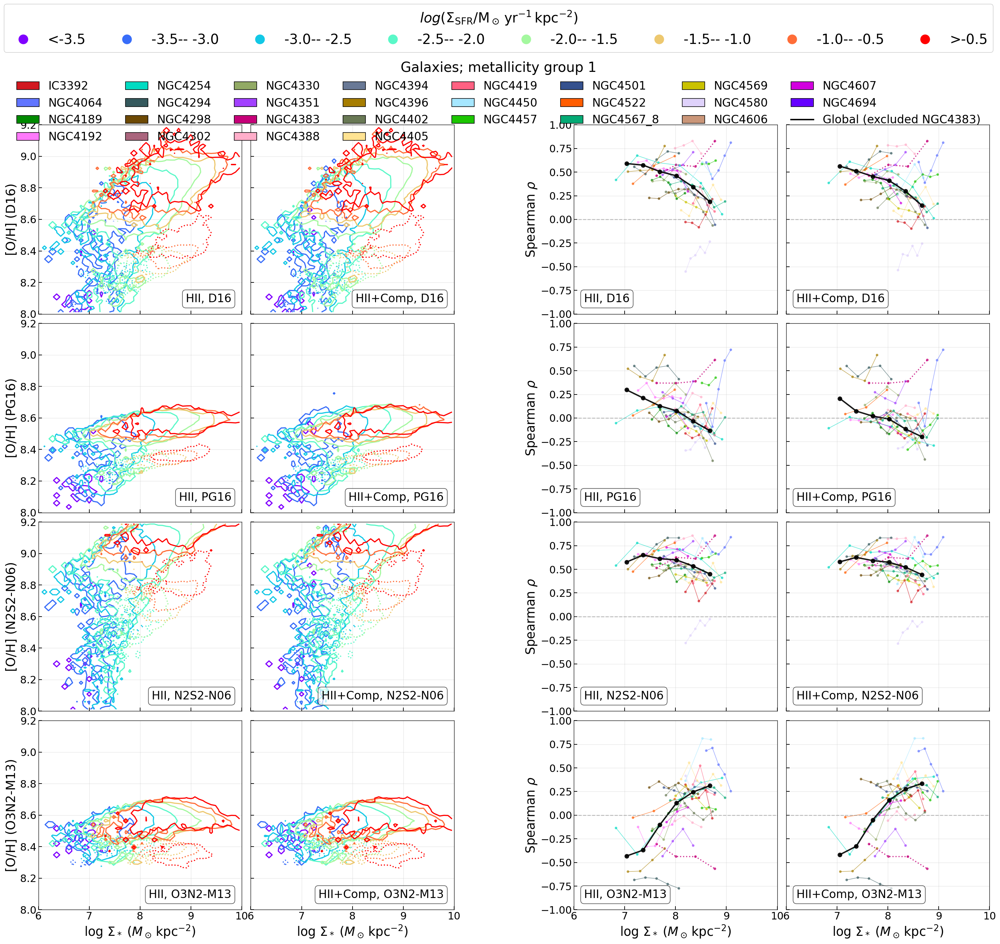

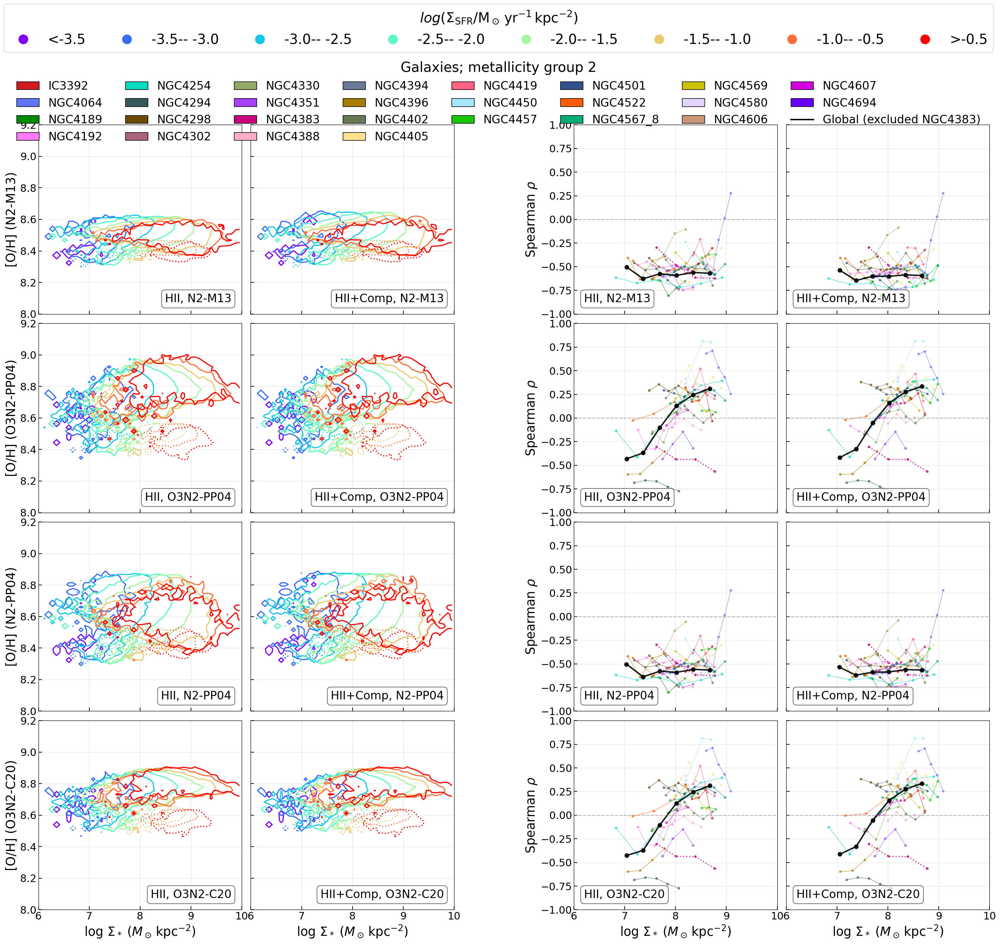

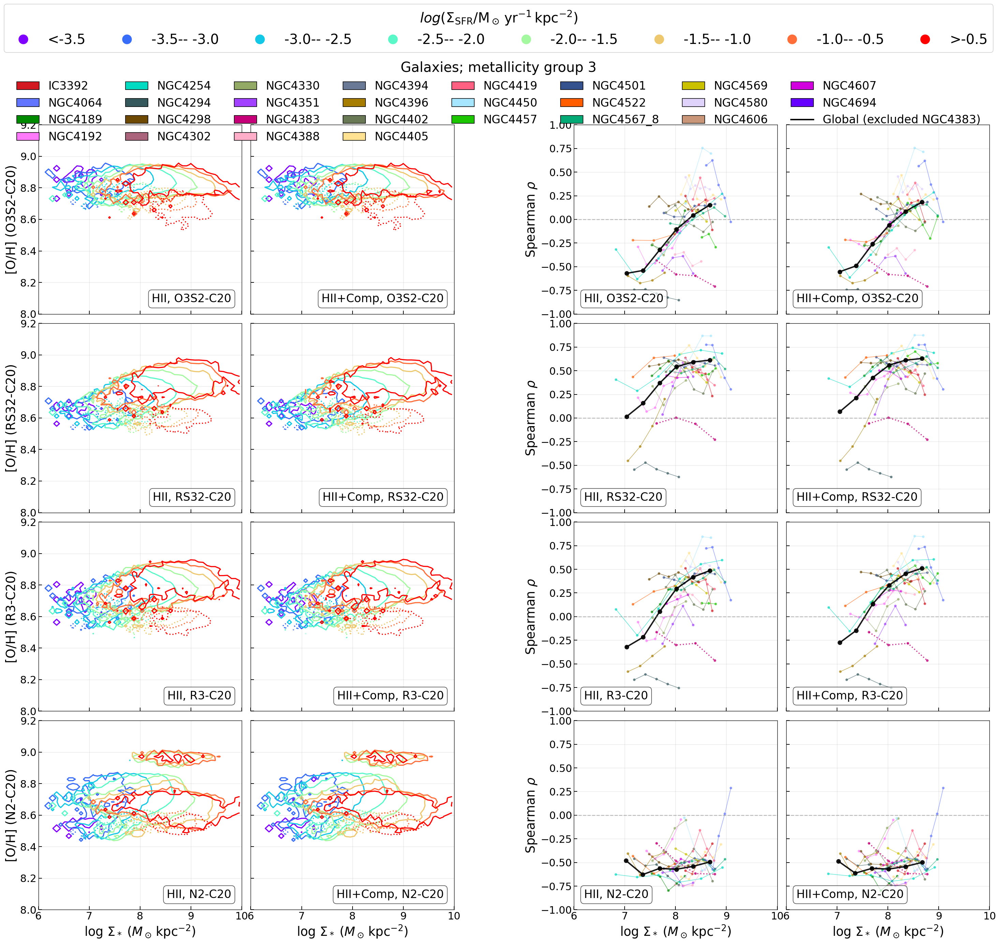

/opt/miniconda3/envs/ICRAR/lib/python3.13/site-packages/numpy/lib/_histograms_impl.py:1085: RuntimeWarning: invalid value encountered in divide
  hist /= s


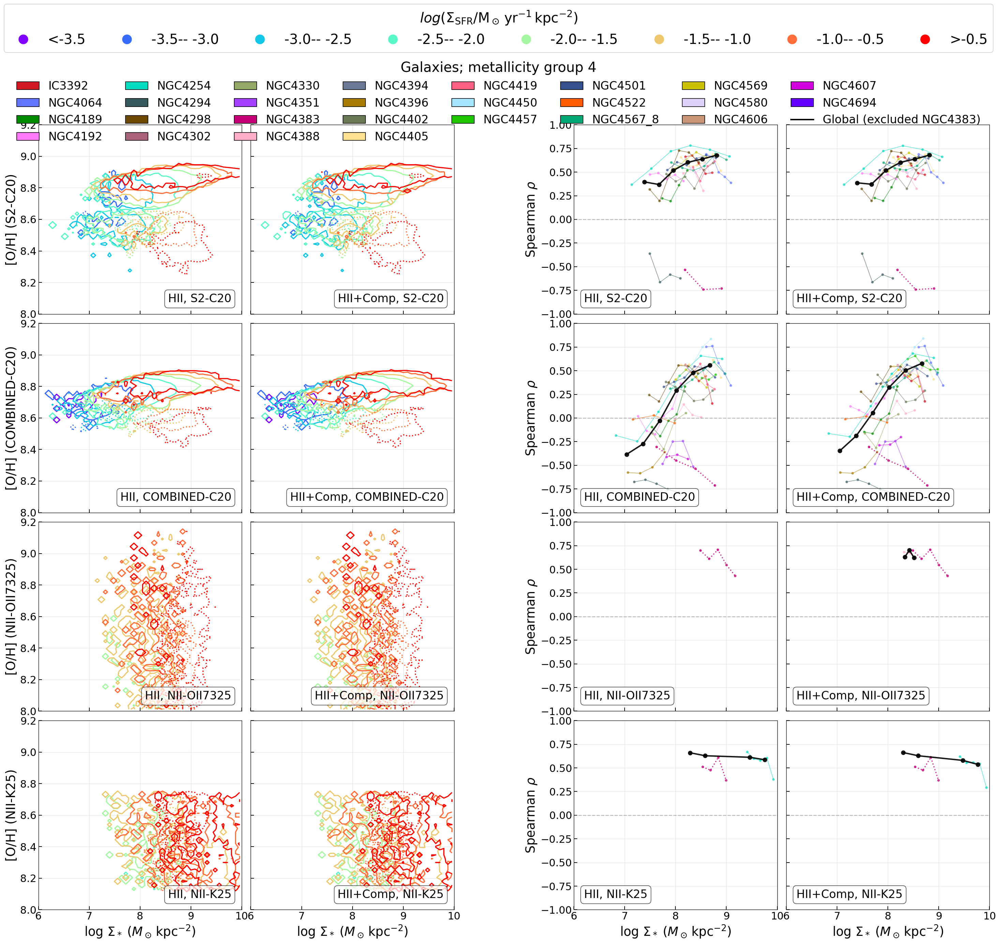

In [7]:
if old_paper_cells_ready(require_ew=True):
    # ------------------------------------------------------------------
    # COMBINED FIGURES: rMZR Scatter (Cols 1-2) and Spearman rho (Cols 3-4)
    # for all finite metallicity calibrations, grouped four per figure.
    # Columns 1/3 use _HII spaxels; columns 2/4 use matching _SF spaxels.
    # ------------------------------------------------------------------
    import numpy as np
    import matplotlib.pyplot as plt
    from astropy.io import fits
    from scipy.stats import spearmanr
    import matplotlib.gridspec as gridspec
    from matplotlib.patches import Patch
    import matplotlib.lines as mlines

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0
    REGIONS = ['HII', 'SF']

    def metallicity_label(hdu_name):
        return hdu_name.removeprefix('O_H_').removesuffix('_HII').replace('_', '-')

    def sf_hdu_name(hii_hdu_name):
        return hii_hdu_name[:-4] + '_SF' if hii_hdu_name.endswith('_HII') else hii_hdu_name + '_SF'

    def discover_hii_metallicity_hdus(galaxies):
        hdu_names = []
        seen = set()
        for gal in galaxies:
            try:
                with fits.open(further_gas_path(gal)) as h:
                    for hdu in h:
                        name = hdu.name
                        if name.startswith('O_H_') and name.endswith('_HII') and name not in seen:
                            seen.add(name)
                            hdu_names.append(name)
            except Exception as e:
                print(f"Skipping metallicity discovery for {gal}: {e}")
        return hdu_names

    def load_maps_mzr(gal, hdu_names):
        ew_path = further_ew_path(gal, EW_FILE_SUFFIX)

        with fits.open(further_spatial_path(gal)) as h:
            sigM = h['LOGMASS_SURFACE_DENSITY'].data
        with fits.open(further_gas_path(gal)) as h:
            sigSFR = {
                'HII': h['LOGSFR_SURFACE_DENSITY_HII'].data,
                'SF': h['LOGSFR_SURFACE_DENSITY_SF'].data if 'LOGSFR_SURFACE_DENSITY_SF' in h else None,
            }
            ha_sigma_obs = h['HA6562_SIGMA'].data
            ha_sigma_corr = h['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in {gal}_gas_BIN_maps_extended.fits')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            oh_maps = {
                'HII': {name: h[name].data if name in h else None for name in hdu_names},
                'SF': {name: h[sf_hdu_name(name)].data if sf_hdu_name(name) in h else None for name in hdu_names},
            }
        with fits.open(ew_path) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_path}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR['HII'].shape, label=f"{gal} {EW_HDU}")
        ew_mask = np.isfinite(ew_ha) & (ew_ha > EW_MIN)
        ew_mask = ew_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        for region in REGIONS:
            if sigSFR[region] is not None:
                sigSFR[region] = np.where(ew_mask, sigSFR[region], np.nan)
            oh_maps[region] = {
                name: (np.where(ew_mask, data, np.nan) if data is not None else None)
                for name, data in oh_maps[region].items()
            }
        return sigM, sigSFR, oh_maps

    def calculate_binned_stats_spearman(x_data, y_data, bin_width=0.2, min_unique=20):
        x_data = np.asarray(x_data)
        y_data = np.asarray(y_data)
        finite = np.isfinite(x_data) & np.isfinite(y_data)
        if np.sum(finite) == 0:
            return np.array([]), np.array([]), np.array([]), np.array([])
        x_min, x_max = np.nanmin(x_data[finite]), np.nanmax(x_data[finite])
        if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
            return np.array([]), np.array([]), np.array([]), np.array([])
        bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
        if bin_edges.size < 2:
            return np.array([]), np.array([]), np.array([]), np.array([])
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        medians, stds, counts, valid_centers = [], [], [], []
        for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
            in_bin = finite & (x_data >= bin_start) & (x_data < bin_end)
            if np.sum(in_bin) == 0:
                continue
            y_in_bin = y_data[in_bin]
            if len(np.unique(y_in_bin)) >= min_unique:
                medians.append(np.nanmedian(y_in_bin))
                stds.append(np.nanstd(y_in_bin))
                counts.append(len(y_in_bin))
                valid_centers.append(bin_centers[i])
        return np.array(valid_centers), np.array(medians), np.array(stds), np.array(counts)

    def sigma_clip_offsets(sfr_off, oh_off):
        valid_corr = np.isfinite(sfr_off) & np.isfinite(oh_off)
        sigma_clip_mask = np.zeros_like(valid_corr, dtype=bool)
        if np.sum(valid_corr) > 0:
            sfr_data = sfr_off[valid_corr]
            oh_data = oh_off[valid_corr]
            sfr_unique = np.unique(sfr_data)
            oh_unique = np.unique(oh_data)
            x_mean = np.mean(sfr_unique)
            x_std = np.std(sfr_unique)
            y_mean = np.mean(oh_unique)
            y_std = np.std(oh_unique)
            within_3sigma = ((sfr_data >= x_mean - 3 * x_std) & (sfr_data <= x_mean + 3 * x_std) &
                             (oh_data >= y_mean - 3 * y_std) & (oh_data <= y_mean + 3 * y_std))
            sigma_clip_mask[valid_corr] = within_3sigma
        return valid_corr, sigma_clip_mask

    def compute_spearman_track(sigM, sigSFR, oh_map, n_bins=6):
        valid_all = np.isfinite(sigM) & np.isfinite(sigSFR) & np.isfinite(oh_map)
        if np.sum(valid_all) == 0:
            return np.array([]), np.array([])
        sigM = sigM[valid_all]
        sigSFR = sigSFR[valid_all]
        oh_map = oh_map[valid_all]
        sigmaM_min = np.nanpercentile(sigM, 2.5)
        sigmaM_max = np.nanpercentile(sigM, 97.5)
        sigmaM_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
        sigmaM_centers = 0.5 * (sigmaM_edges[:-1] + sigmaM_edges[1:])
        valid_centers, rho_values = [], []
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM <= sigmaM_edges[i+1])
            else:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])
            if np.sum(bin_mask) <= 20:
                continue
            sfr_off = sigSFR[bin_mask] - np.mean(sigSFR[bin_mask])
            oh_off = oh_map[bin_mask] - np.mean(oh_map[bin_mask])
            valid_corr, sigma_clip_mask = sigma_clip_offsets(sfr_off, oh_off)
            centers, _, _, _ = calculate_binned_stats_spearman(
                sfr_off[sigma_clip_mask], oh_off[sigma_clip_mask], bin_width=0.2, min_unique=20
            )
            if centers.size >= 3 and np.sum(sigma_clip_mask & valid_corr) > 2:
                try:
                    rho, _ = spearmanr(sfr_off[sigma_clip_mask & valid_corr], oh_off[sigma_clip_mask & valid_corr])
                    if np.isfinite(rho):
                        valid_centers.append(sigmaM_centers[i])
                        rho_values.append(rho)
                except Exception:
                    pass
        return np.array(valid_centers), np.array(rho_values)

    def compute_spearman_track_from_offsets(sigM, sfr_off, oh_off, n_bins=6):
        valid_all = np.isfinite(sigM) & np.isfinite(sfr_off) & np.isfinite(oh_off)
        if np.sum(valid_all) == 0:
            return np.array([]), np.array([])
        sigM = sigM[valid_all]
        sfr_off = sfr_off[valid_all]
        oh_off = oh_off[valid_all]
        sigmaM_min = np.nanpercentile(sigM, 2.5)
        sigmaM_max = np.nanpercentile(sigM, 97.5)
        sigmaM_edges = np.linspace(sigmaM_min, sigmaM_max, n_bins + 1)
        sigmaM_centers = 0.5 * (sigmaM_edges[:-1] + sigmaM_edges[1:])
        valid_centers, rho_values = [], []
        for i in range(n_bins):
            if i == 0:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])
            elif i == n_bins - 1:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM <= sigmaM_edges[i+1])
            else:
                bin_mask = (sigM >= sigmaM_edges[i]) & (sigM < sigmaM_edges[i+1])
            if np.sum(bin_mask) <= 20:
                continue
            sfr_off_bin = sfr_off[bin_mask]
            oh_off_bin = oh_off[bin_mask]
            valid_corr, sigma_clip_mask = sigma_clip_offsets(sfr_off_bin, oh_off_bin)
            centers, _, _, _ = calculate_binned_stats_spearman(
                sfr_off_bin[sigma_clip_mask], oh_off_bin[sigma_clip_mask], bin_width=0.2, min_unique=20
            )
            if centers.size >= 3 and np.sum(sigma_clip_mask & valid_corr) > 2:
                try:
                    rho, _ = spearmanr(sfr_off_bin[sigma_clip_mask & valid_corr], oh_off_bin[sigma_clip_mask & valid_corr])
                    if np.isfinite(rho):
                        valid_centers.append(sigmaM_centers[i])
                        rho_values.append(rho)
                except Exception:
                    pass
        return np.array(valid_centers), np.array(rho_values)

    galaxies_all = ordered_galaxies_by_fixed_palette(physics_ready_galaxies(require_ew=True))
    excluded_galaxies = {'NGC4383'}
    galaxies = [g for g in galaxies_all if g not in excluded_galaxies]
    galaxy_color_dict = {gal: galaxy_color(gal) for gal in galaxies_all}
    hdu_names_all = discover_hii_metallicity_hdus(galaxies_all)
    print(f"Found {len(hdu_names_all)} O_H_*_HII metallicity HDUs: {', '.join(hdu_names_all)}")
    print(f"Processing {len(galaxies)} galaxies (excluding NGC4383 for stats): {', '.join(galaxies)}")

    all_logSigmaM = {region: {name: [] for name in hdu_names_all} for region in REGIONS}
    all_logSigmaSFR = {region: {name: [] for name in hdu_names_all} for region in REGIONS}
    all_oh = {region: {name: [] for name in hdu_names_all} for region in REGIONS}
    spearman_results = {
        region: {name: {'galaxies': {}, 'global_pixels': {'sigM': [], 'sfr_off': [], 'oh_off': []}}
                 for name in hdu_names_all}
        for region in REGIONS
    }
    ngc4383_data = {
        region: {
            'sigM': {name: [] for name in hdu_names_all},
            'sigSFR': {name: [] for name in hdu_names_all},
            'oh': {name: [] for name in hdu_names_all},
        }
        for region in REGIONS
    }
    ngc4383_spearman = {region: {name: ([], []) for name in hdu_names_all} for region in REGIONS}
    finite_counts = {region: {name: 0 for name in hdu_names_all} for region in REGIONS}

    print("Collecting data...")
    for gal in galaxies_all:
        try:
            logSigmaM, logSigmaSFR, oh_maps = load_maps_mzr(gal, hdu_names_all)
        except Exception as e:
            print(f"Skipping {gal}: {e}")
            continue

        for region in REGIONS:
            if logSigmaSFR[region] is None:
                continue
            for hdu_name, oh_map in oh_maps[region].items():
                if oh_map is None:
                    continue
                common_mask = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR[region]) & np.isfinite(oh_map)
                finite_counts[region][hdu_name] += int(np.sum(common_mask))
                if gal == 'NGC4383':
                    ngc4383_data[region]['sigM'][hdu_name] = logSigmaM[common_mask].flatten()
                    ngc4383_data[region]['sigSFR'][hdu_name] = logSigmaSFR[region][common_mask].flatten()
                    ngc4383_data[region]['oh'][hdu_name] = oh_map[common_mask].flatten()
                    ngc4383_spearman[region][hdu_name] = compute_spearman_track(logSigmaM, logSigmaSFR[region], oh_map)
                    continue

                all_logSigmaM[region][hdu_name].extend(logSigmaM[common_mask].flatten())
                all_logSigmaSFR[region][hdu_name].extend(logSigmaSFR[region][common_mask].flatten())
                all_oh[region][hdu_name].extend(oh_map[common_mask].flatten())
                x, y = compute_spearman_track(logSigmaM, logSigmaSFR[region], oh_map)
                if len(x) > 0:
                    spearman_results[region][hdu_name]['galaxies'][gal] = (x, y)
                    v_all = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR[region]) & np.isfinite(oh_map)
                    if np.sum(v_all) > 0:
                        sM_v = logSigmaM[v_all]
                        sSFR_v = logSigmaSFR[region][v_all]
                        oh_v = oh_map[v_all]
                        sM_min = np.nanpercentile(sM_v, 2.5)
                        sM_max = np.nanpercentile(sM_v, 97.5)
                        sM_edges = np.linspace(sM_min, sM_max, 7)
                        for bi in range(6):
                            if bi == 0:
                                bm = (sM_v >= sM_edges[bi]) & (sM_v < sM_edges[bi+1])
                            elif bi == 5:
                                bm = (sM_v >= sM_edges[bi]) & (sM_v <= sM_edges[bi+1])
                            else:
                                bm = (sM_v >= sM_edges[bi]) & (sM_v < sM_edges[bi+1])
                            if np.sum(bm) > 0:
                                sfr_off_b = sSFR_v[bm] - np.mean(sSFR_v[bm])
                                oh_off_b = oh_v[bm] - np.mean(oh_v[bm])
                                vc = np.isfinite(sfr_off_b) & np.isfinite(oh_off_b)
                                if np.sum(vc) > 0:
                                    spearman_results[region][hdu_name]['global_pixels']['sigM'].extend(sM_v[bm][vc])
                                    spearman_results[region][hdu_name]['global_pixels']['sfr_off'].extend(sfr_off_b[vc])
                                    spearman_results[region][hdu_name]['global_pixels']['oh_off'].extend(oh_off_b[vc])

    hdu_names = [name for name in hdu_names_all if any(finite_counts[region][name] > 0 for region in REGIONS)]
    skipped_hdus = [name for name in hdu_names_all if all(finite_counts[region][name] == 0 for region in REGIONS)]
    if skipped_hdus:
        print(f"Skipping all-NaN metallicity HDUs after masks: {', '.join(skipped_hdus)}")

    for region in REGIONS:
        all_logSigmaM[region] = {name: np.array(values) for name, values in all_logSigmaM[region].items()}
        all_logSigmaSFR[region] = {name: np.array(values) for name, values in all_logSigmaSFR[region].items()}
        all_oh[region] = {name: np.array(values) for name, values in all_oh[region].items()}

    print("Computing global Spearman trends...")
    for region in REGIONS:
        for hdu_name in hdu_names:
            g_data = spearman_results[region][hdu_name]['global_pixels']
            if len(g_data['sigM']) > 0:
                spearman_results[region][hdu_name]['global_track'] = compute_spearman_track_from_offsets(
                    np.array(g_data['sigM']), np.array(g_data['sfr_off']), np.array(g_data['oh_off'])
                )
            else:
                spearman_results[region][hdu_name]['global_track'] = (np.array([]), np.array([]))

    sfr_bin_edges = [-np.inf, -3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5, np.inf]
    n_bins = len(sfr_bin_edges) - 1
    mzr_colors = plt.cm.rainbow(np.linspace(0, 1, n_bins))
    bin_labels = ['<-3.5', '-3.5-- -3.0', '-3.0-- -2.5', '-2.5-- -2.0', '-2.0-- -1.5', '-1.5-- -1.0', '-1.0-- -0.5', '>-0.5']

    def plot_mzr_axis(ax, hdu_name, region, calib_name, region_label, row_idx, col_idx, n_rows):
        logSigmaM_region = all_logSigmaM[region][hdu_name]
        logSigmaSFR_region = all_logSigmaSFR[region][hdu_name]
        oh_region = all_oh[region][hdu_name]
        for i in range(n_bins):
            in_bin = (logSigmaSFR_region >= sfr_bin_edges[i]) & (logSigmaSFR_region < sfr_bin_edges[i+1])
            if np.sum(in_bin) > 20:
                try:
                    x = logSigmaM_region[in_bin]
                    y = oh_region[in_bin]
                    xmin, xmax = 6, 10
                    ymin, ymax = 8.0, 9.2
                    H, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[xmin, xmax], [ymin, ymax]], density=True)
                    H_flat = H.flatten()
                    H_sorted = np.sort(H_flat)[::-1]
                    H_cumsum = np.cumsum(H_sorted)
                    H_cumsum /= H_cumsum[-1]
                    threshold_95 = H_sorted[np.where(H_cumsum >= 0.95)[0][0]]
                    x_centers = (xedges[:-1] + xedges[1:]) / 2
                    y_centers = (yedges[:-1] + yedges[1:]) / 2
                    ax.contour(x_centers, y_centers, H.T, levels=[threshold_95],
                               colors=[mzr_colors[i]], linestyles='solid', linewidths=2)
                except Exception:
                    pass

            if len(ngc4383_data[region]['sigM'].get(hdu_name, [])) > 0 and len(ngc4383_data[region]['oh'].get(hdu_name, [])) > 0:
                ngc_sigM = np.array(ngc4383_data[region]['sigM'][hdu_name])
                ngc_oh = np.array(ngc4383_data[region]['oh'][hdu_name])
                ngc_sfr = np.array(ngc4383_data[region]['sigSFR'][hdu_name])
                in_bin_ngc = (ngc_sfr >= sfr_bin_edges[i]) & (ngc_sfr < sfr_bin_edges[i+1])
                if np.sum(in_bin_ngc) > 20:
                    try:
                        x = ngc_sigM[in_bin_ngc]
                        y = ngc_oh[in_bin_ngc]
                        xmin, xmax = 6, 10
                        ymin, ymax = 8.0, 9.2
                        H, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[xmin, xmax], [ymin, ymax]], density=True)
                        H_flat = H.flatten()
                        H_sorted = np.sort(H_flat)[::-1]
                        H_cumsum = np.cumsum(H_sorted)
                        H_cumsum /= H_cumsum[-1]
                        threshold_95 = H_sorted[np.where(H_cumsum >= 0.95)[0][0]]
                        x_centers = (xedges[:-1] + xedges[1:]) / 2
                        y_centers = (yedges[:-1] + yedges[1:]) / 2
                        ax.contour(x_centers, y_centers, H.T, levels=[threshold_95],
                                   colors=[mzr_colors[i]], linestyles='dotted', linewidths=2)
                    except Exception:
                        pass

        if row_idx == n_rows - 1:
            ax.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=22)
        else:
            ax.set_xlabel('')
            ax.tick_params(labelbottom=False)
        if col_idx == 0:
            ax.set_ylabel(f'[O/H] ({calib_name})', fontsize=22)
        else:
            ax.set_ylabel('')
            ax.tick_params(labelleft=False)
        ax.tick_params(labelsize=18)
        ax.set_xlim(6, 10)
        ax.set_ylim(8.0, 9.2)
        ax.grid(True, alpha=0.3)
        ax.text(0.95, 0.05, f'{region_label}, {calib_name}', transform=ax.transAxes,
                fontsize=20, verticalalignment='bottom', horizontalalignment='right',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    def plot_spearman_axis(ax, hdu_name, region, calib_name, region_label, row_idx, col_idx, n_rows):
        for gal, (x, y) in spearman_results[region][hdu_name]['galaxies'].items():
            if len(x) <= 2:
                continue
            color = galaxy_color_dict[gal]
            idx = np.argsort(x)
            ax.plot(x[idx], y[idx], color=color, alpha=0.6, linewidth=1)
            ax.scatter(x[idx], y[idx], color=color, s=20, alpha=0.7, edgecolors='none')
        gx_ngc, gy_ngc = ngc4383_spearman[region][hdu_name]
        if len(gx_ngc) > 2:
            color = galaxy_color_dict['NGC4383']
            idx = np.argsort(gx_ngc)
            ax.plot(gx_ngc[idx], gy_ngc[idx], color=color, alpha=0.8, linewidth=2, linestyle=':')
            ax.scatter(gx_ngc[idx], gy_ngc[idx], color=color, s=20, alpha=0.8, edgecolors='none')
        gx, gy = spearman_results[region][hdu_name].get('global_track', ([], []))
        if len(gx) > 2:
            idx = np.argsort(gx)
            ax.plot(gx[idx], gy[idx], color='black', linewidth=2.5, alpha=0.9)
            ax.scatter(gx[idx], gy[idx], color='black', s=50, alpha=0.9, zorder=10)
        ax.axhline(0, color='gray', linestyle='--', alpha=0.5)
        ax.set_ylim(-1.0, 1.0)
        ax.set_xlim(6, 10)
        if row_idx == n_rows - 1:
            ax.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=22)
        else:
            ax.set_xlabel('')
            ax.tick_params(labelbottom=False)
        if col_idx == 0:
            ax.set_ylabel(r'Spearman $\rho$', fontsize=22)
        else:
            ax.set_ylabel('')
            ax.tick_params(labelleft=False)
        ax.tick_params(labelsize=18)
        ax.grid(True, alpha=0.3)
        ax.text(0.05, 0.05, f'{region_label}, {calib_name}', transform=ax.transAxes,
                fontsize=20, verticalalignment='bottom', horizontalalignment='left',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

    def plot_group(group_hdus, group_idx):
        fig = plt.figure(figsize=(30, 24))
        gs = gridspec.GridSpec(4, 5, figure=fig, hspace=0.05, top=0.85, bottom=0.05,
                               width_ratios=[1, 1, 0.5, 1, 1], wspace=0.05)
        mzr_legend_handles = [
            mlines.Line2D([], [], color=mzr_colors[i], marker='o', linestyle='None', markersize=16, label=bin_labels[i])
            for i in range(n_bins)
        ]
        mzr_legend_labels = bin_labels

        for row_idx, hdu_name in enumerate(group_hdus):
            calib_name = metallicity_label(hdu_name)
            ax_mzr_HII = fig.add_subplot(gs[row_idx, 0])
            ax_mzr_SF = fig.add_subplot(gs[row_idx, 1])
            plot_mzr_axis(ax_mzr_HII, hdu_name, 'HII', calib_name, 'HII', row_idx, 0, len(group_hdus))
            plot_mzr_axis(ax_mzr_SF, hdu_name, 'SF', calib_name, 'HII+Comp', row_idx, 1, len(group_hdus))

            ax_sp_HII = fig.add_subplot(gs[row_idx, 3])
            ax_sp_SF = fig.add_subplot(gs[row_idx, 4])
            plot_spearman_axis(ax_sp_HII, hdu_name, 'HII', calib_name, 'HII', row_idx, 0, len(group_hdus))
            plot_spearman_axis(ax_sp_SF, hdu_name, 'SF', calib_name, 'HII+Comp', row_idx, 1, len(group_hdus))

        fig.legend(mzr_legend_handles, mzr_legend_labels, loc='upper center', bbox_to_anchor=(0.5, 0.98),
                   ncol=8, fontsize=24, framealpha=0.9,
                   title=r'$log(\Sigma_\mathrm{SFR}/\mathrm{M_\odot\,yr^{-1}\,kpc^{-2}})$', title_fontsize=24)
        spearman_legend_elements = [Patch(facecolor=galaxy_color_dict[gal], edgecolor='black', label=gal)
                                    for gal in galaxies_all if gal not in ['NGC4293', 'NGC4698']]
        spearman_legend_elements.append(mlines.Line2D([], [], color='black', lw=2.5, label='Global (excluded NGC4383)'))
        fig.legend(handles=spearman_legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.925),
                   ncol=8, frameon=False, fontsize=20, title=f'Galaxies; metallicity group {group_idx}', title_fontsize=24)
        plt.tight_layout(rect=[0, 0, 1, 0.85])
        plt.show()

    if hdu_names:
        for group_idx, start in enumerate(range(0, len(hdu_names), 4), start=1):
            plot_group(hdu_names[start:start + 4], group_idx)
    else:
        print("No finite O_H_* metallicity maps to plot.")
else:
    print("Skipped copied previous-project analysis cell 7: no nested *_further mass/SFR/OH+EW products are ready yet.")
